## Biological Signals Analysis - Week 4 Homework

### Due: Feb. 14, 2024

### Table of Contents
- Part I: Exploring and Visualizing Microscopy Dataset
- Part II: Histograms
- Part III: Image Thresholding and Blurring
- Part IV: Edge Detection
- Part V: Segmentation

### Part I: Exploring and Visualizing Microscopy Dataset

The dataset for this exercise was part of a competition on Kaggle sponsored by Sartorius AG, and can be accessed through the following link: [Sartorius - Cell Instance Segmentation](https://www.kaggle.com/competitions/sartorius-cell-instance-segmentation/overview). 

Your first task is to download this dataset and use Python to explore and visualize it. Your exploration should include, but is not limited to, the following:
   - Load several images from the dataset.
   - Display some of the images using a Python library of your choice
   - Print out the shape and characteristics of the dataset, including dimensions of the images and any other relevant information.
   - Discuss any observations you have about the dataset based on your initial exploration.


Example notebooks that were submitted for the original competition, and may be helpful in this exercise, are available under the "Code" section of the dataset's website on Kaggle. A particularly useful example to get you started is this notebook: [Train Sartorius - Segmentation EDA - EffDet - TF](https://www.kaggle.com/code/dschettler8845/train-sartorius-segmentation-eda-effdet-tf).

In [ ]:
import numpy as np
import cv2
from skimage import io
import os
from os import listdir
import matplotlib.pyplot as plt
import skimage

images_folder = "train"
images_list = []
cnt =0
for i,image in enumerate(os.listdir(images_folder)):
    if i<10:
        image_path = os.path.join(images_folder, image)
        current_image = skimage.io.imread(image_path)
        images_list.append(current_image)

        print(f'Shape of Image Array {current_image.shape}')
        if len(current_image.shape) <= 2:
            print(" Grayscale Image")
        else:
            print('Color Image')
        print (f' Bit Depth: {current_image.dtype}')

        plt.figure(figsize=(8,4))
        plt.imshow(current_image, cmap = 'gray')
        plt.title(f'Image Number: {i+1}')
        plt.axis('off')
        plt.show()





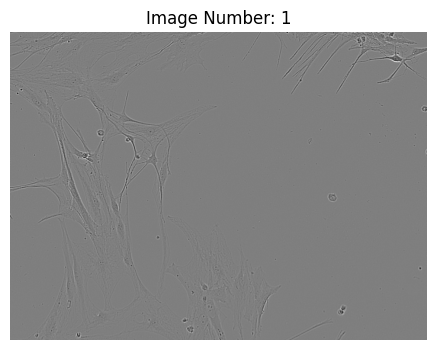
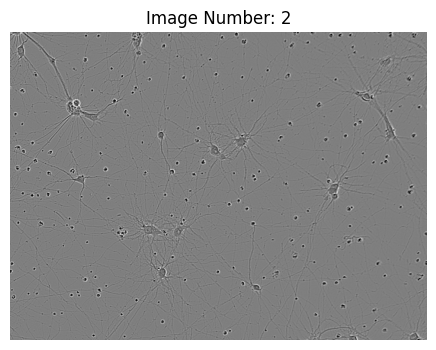
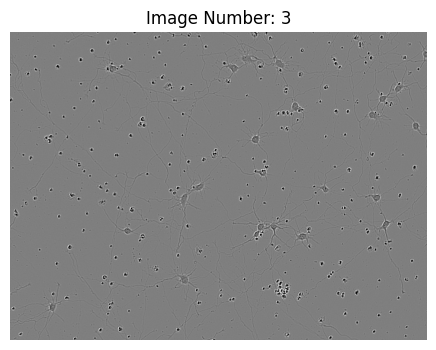
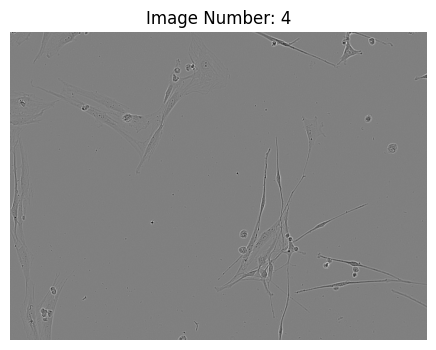
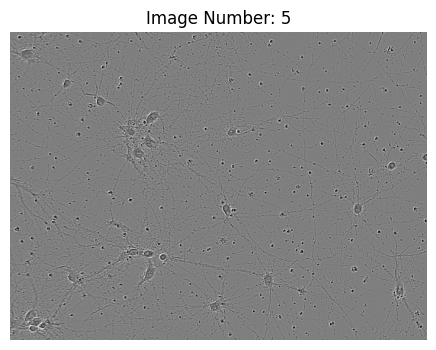
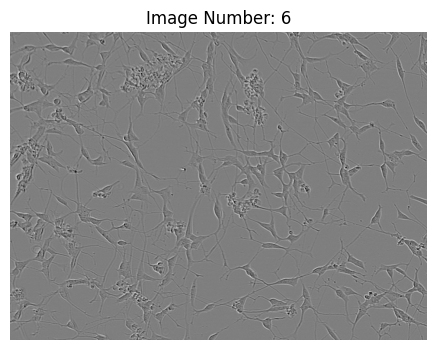
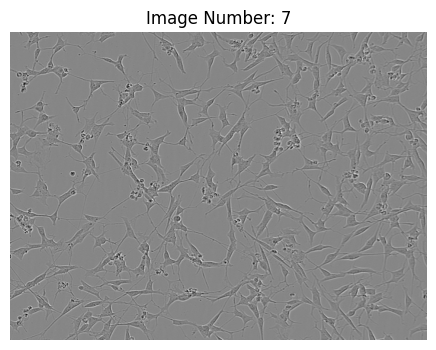
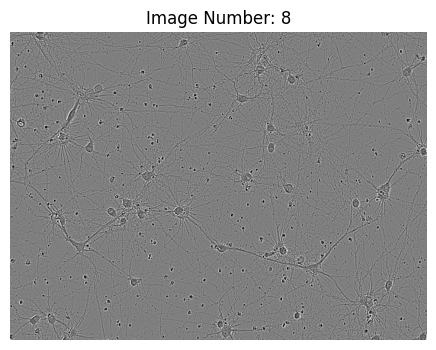
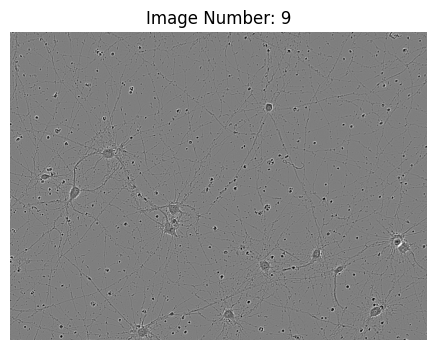
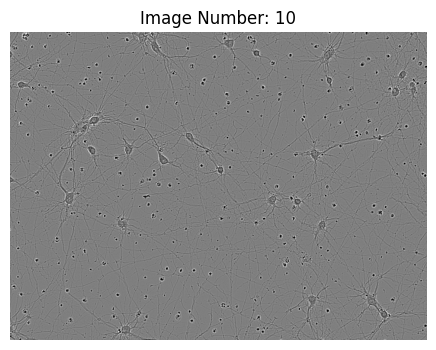

Shape of Image Array (520, 704)

Grayscale Image

Bit Depth: uint8 - 8 Bits


From Initial Observation, I am assuming those images where taken by microscopy and depicting neuronal structures with in the Brain. Every image has different features. 

### Part II: Histograms

Please follow these steps:

- **Select Images**: Choose a subset of 10 images from the Sartorius dataset.
- **Create Histogram Arrays**: For each of the 10 selected images, create histogram arrays. These arrays should represent the frequency distribution of the pixel intensities in the images. Note that at this stage, you are only creating the arrays, not yet plotting them.
- **Average Histogram**: Calculate the average histogram by averaging the occurrence values across the 10 images. This will result in a single histogram array representing the average distribution of pixel intensities across your selected subset.
- **Visualize the Average Histogram**: Using your preferred plotting library, visualize the averaged histogram.

In [ ]:
Histograms_list =[]  

for image in images_list:
    Histogram_Array, _ = np.histogram(image.ravel(),bins=256, range= (0,255 ))
    Histograms_list.append(Histogram_Array)

Histograms = np.array(Histograms_list)
Average_Histogram = np.mean (Histograms,axis = 0)
plt.figure(figsize=(5,2))
plt.plot(Average_Histogram, color= 'red', alpha = 0.5)
plt.title('Average Pixel Intensities')
plt.xlabel = ('Pixel Intensity')
plt.ylabel = ('Frequency')
plt.legend()
plt.show()





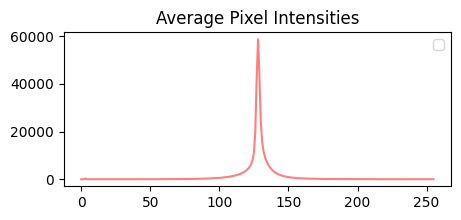

### Part III: Image Thresholding and Blurring

Please follow these steps:

- **Blurring**: Apply a blurring technique to each of the 10 images you selected in the previous step to reduce noise. You may use Gaussian blurring or any other blurring method of your choice.
- **Thresholding**: After blurring, apply thresholding to the same images. Choose appropriate threshold values that you find suitable for these images.
- **Visualization**: Create visualizations to compare the original and processed images. Include the following types of visualizations:
  - Side-by-side visual comparisons of each image before and after the blurring and thresholding.
  - Histogram plots of the pixel instensity values averaged across the 10 images
- **Mathematical Expressions**: In a markdown cell, write down the mathematical expressions or formulas for the blurring and thresholding operations you have used.

In [ ]:
from scipy.ndimage import gaussian_filter


Filtered_images_List = []
Filtered_Histogram_List =[]
sigma_ = 1
for i,image in enumerate(images_list):
    filtered_image = gaussian_filter(image, sigma = sigma_)
    _, otsu_thresh = cv2.threshold(filtered_image,100,  255, cv2.THRESH_BINARY)
    Filtered_images_List.append(otsu_thresh)
    
    Filtered_Image_Histogram, _ = np.histogram(otsu_thresh.ravel(),bins=256, range= (0,255 )) #check!!
    Filtered_Histogram_List.append(Filtered_Image_Histogram)

    fig, axes =plt.subplots(1,2,figsize =(8,4))
    axes[0].imshow(image, cmap ="gray")
    axes[0].set_title(f'Before Filtering')
    axes[0].axis('off')
    axes[1].imshow(otsu_thresh, cmap = 'gray')
    axes[1].set_title('After Gaussian filter and Threshold')
    axes[1].axis('off')
    plt.suptitle(f"Image Number: {i+1}")
    plt.tight_layout()
    plt.show()
    
Filtered_Histograms = np.array(Filtered_Histogram_List)
Average_Filtered_Histogram = np.mean (Filtered_Histograms,axis = 0)
plt.figure(figsize=(5,2))
plt.plot(Average_Filtered_Histogram, color= 'red', alpha = 0.5)
plt.title('Average Filtered Historgrams')
plt.xlabel = ('Pixel Intensity')
plt.ylabel = ('Frequency')
plt.show()



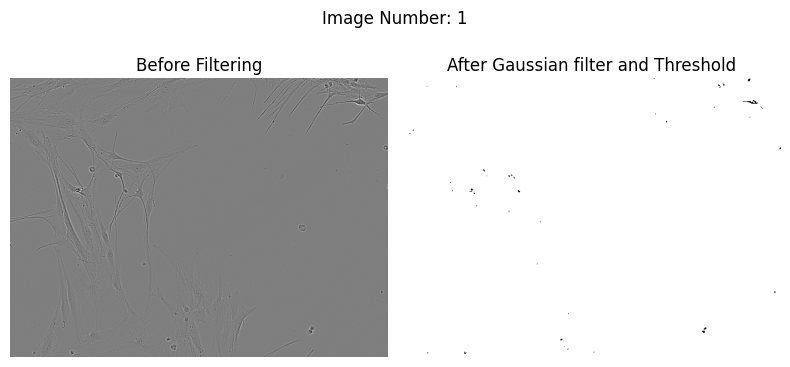
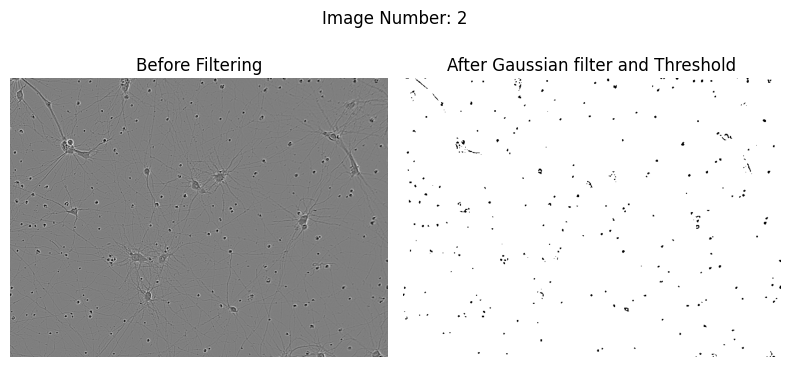
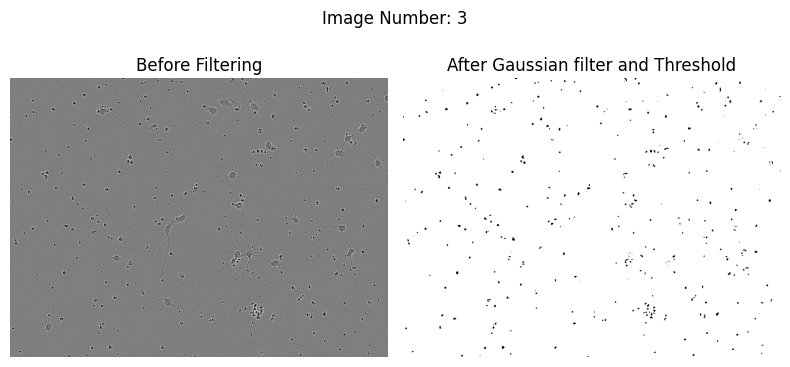
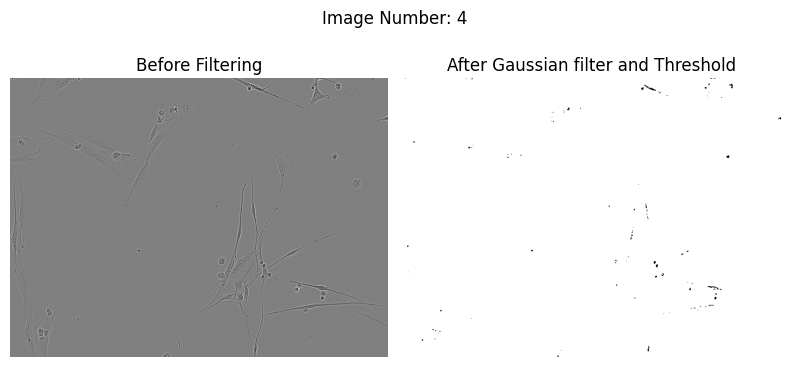
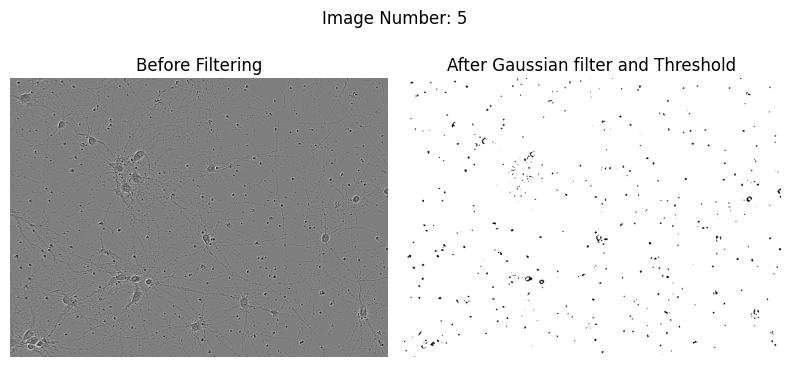
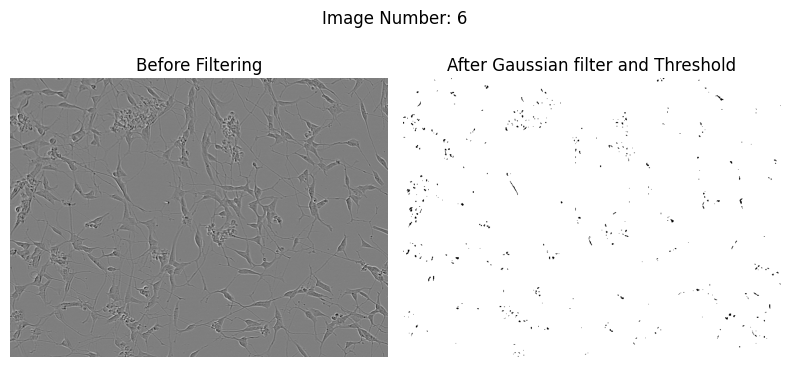
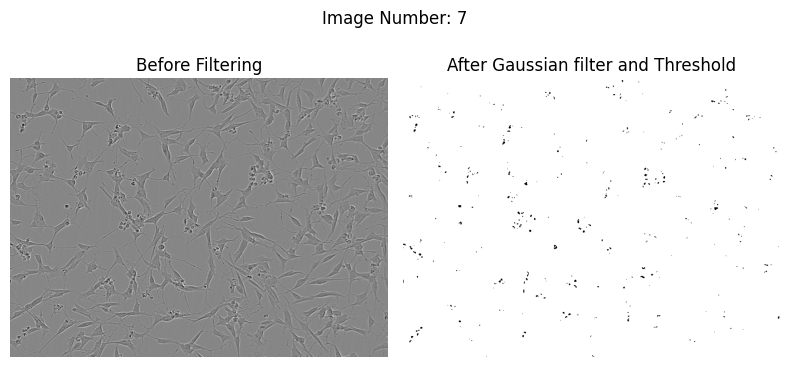
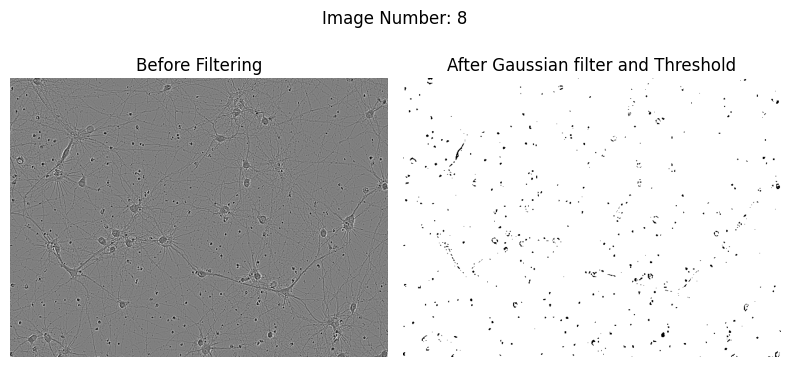
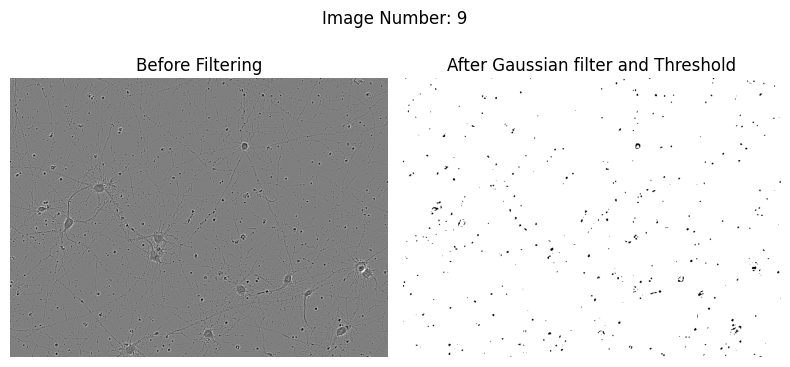
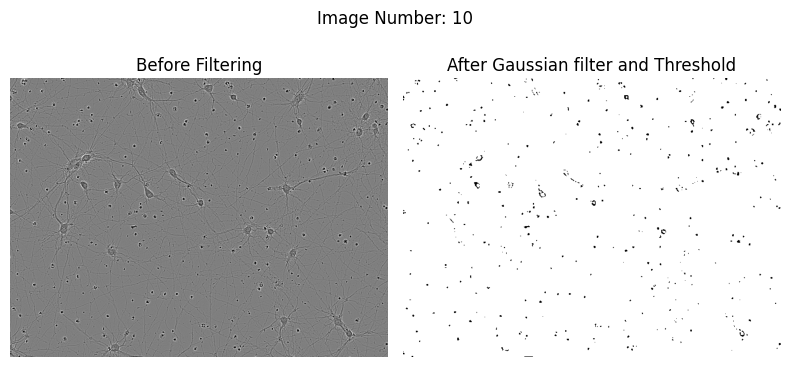

For Blurring, I have used the Gaussian Filter:

In a 2D Gaussian filter, the kernel values are calculated using the Gaussian function:

$ G(x, y) = \frac{1}{2 \pi \sigma^2} e^{- \frac{x^2 + y^2}{2 \sigma^2}} $

and the convolution of an image $ I $ with a Gaussian filter $ G $ is mathematically represented as:

$ (I * G)(i, j) = \sum_{u=-k}^{k} \sum_{v=-k}^{k} I(i+u, j+v) \cdot G(u, v) $

For Thresholding: I have used Simple Thresholding.
I chose my global value from the averge pixel histogram and set it to 100. I used simple thresholding becuase it helped me to segment the cells in part V.


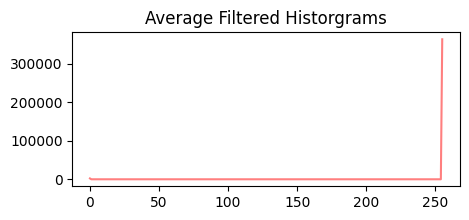

### Part IV: Edge Detection

Please follow these steps:
- **Choose an Edge Detection Method**: Select an edge detection method of your choice. This could be the Sobel operator, Canny edge detection, or any other method you are familiar with or wish to explore.
- **Apply Edge Detection**: Apply the chosen edge detection technique to the same subset of 10 images you have been working with. Make sure to adjust any parameters or thresholds to optimize the edge detection for these specific images.
- **Visualize the Results**: Create visualizations to display the original images alongside their edge-detected counterparts. 
- **Mathematical Expressions**: In a markdown cell, write down the mathematical expressions or formulas for the edge detection operations you have used.

In [ ]:
from cProfile import label
from matplotlib import scale


GM_list =[]

for i, image in enumerate(Filtered_images_List):
   
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0 ,ksize =3)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1 ,ksize =3)
    gradient_magnitude = np.sqrt(sobel_x**2, sobel_y**2)
    gradient_magnitude = cv2.normalize(gradient_magnitude, None,0, 255,cv2.NORM_MINMAX,dtype=cv2.CV_8U)
    GM_list.append(gradient_magnitude)

    
    fig, axs = plt.subplots(1,2,figsize =(20,16))
    axs[0].imshow(images_list[i], cmap = "gray")
    axs[0].set_title(f'Original Image Number {i+1}')
    axs[0].axis('off')
    
    axs[1].imshow(gradient_magnitude, cmap = "grey")
    axs[1].set_title(f'Edge Detection using Sobel Image Number {i+1}')
    axs[1].axis('off')
    plt.tight_layout()
    plt.show()





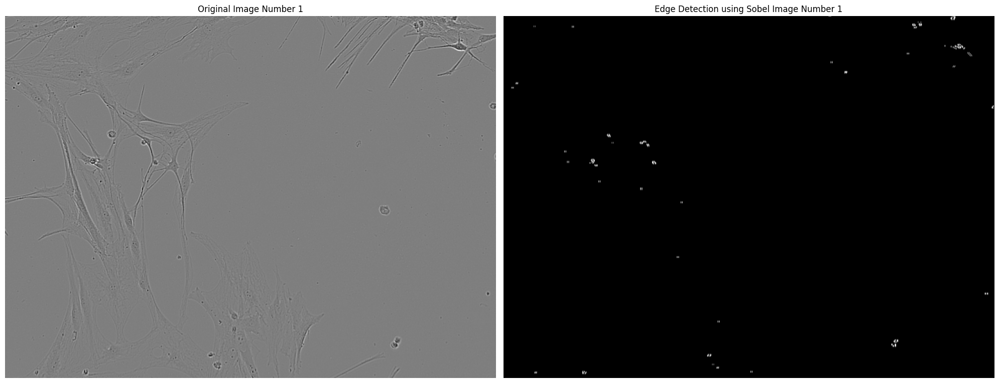
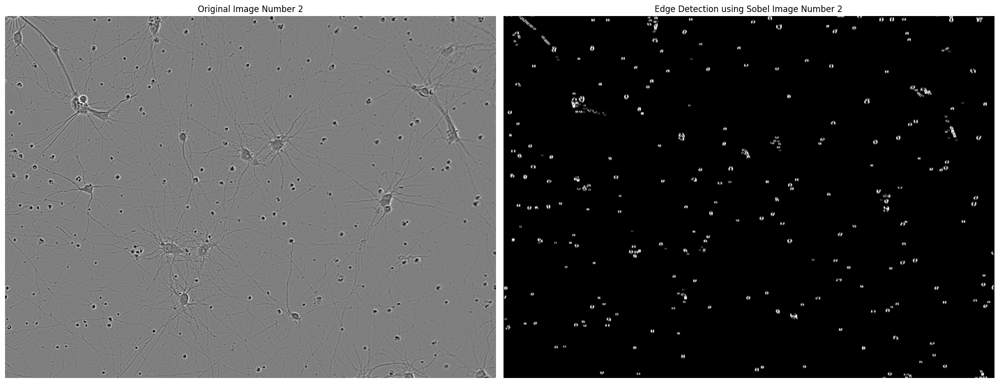
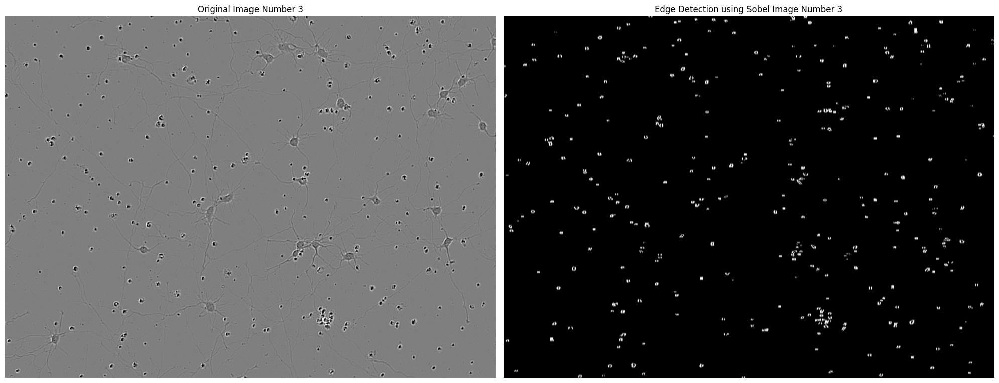
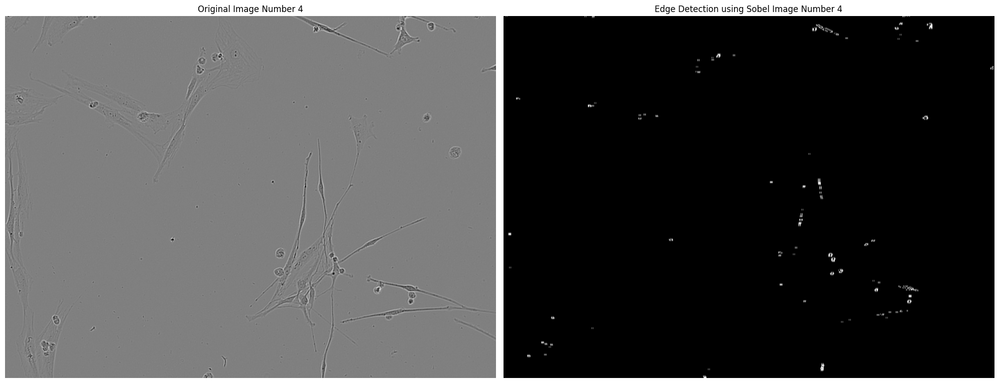
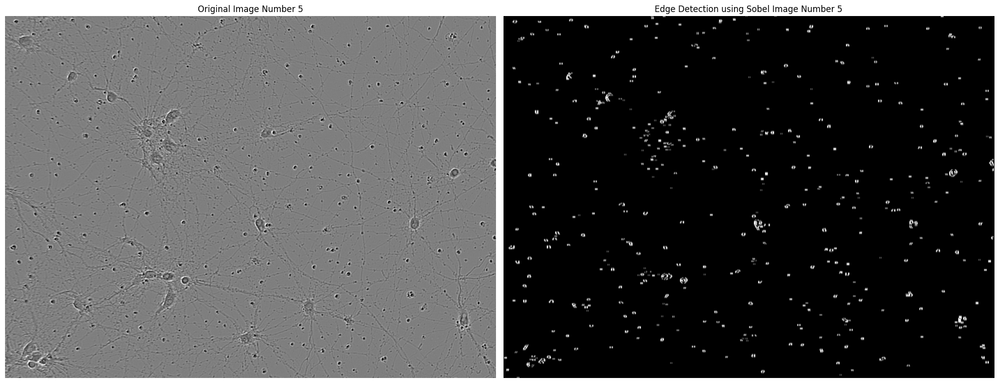
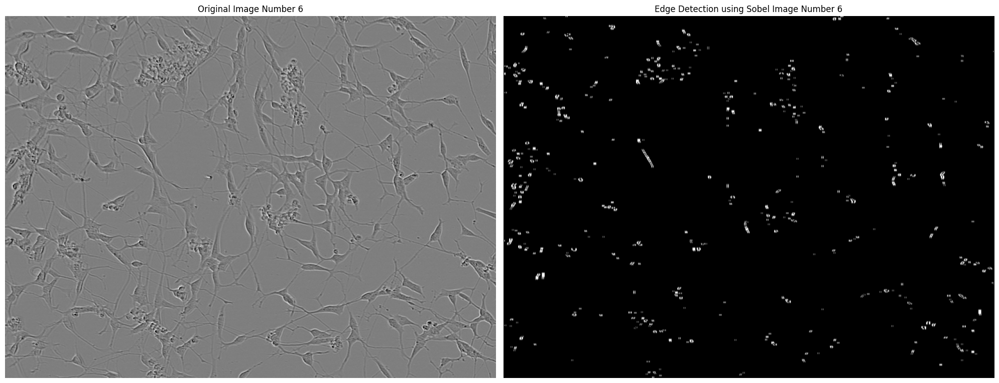
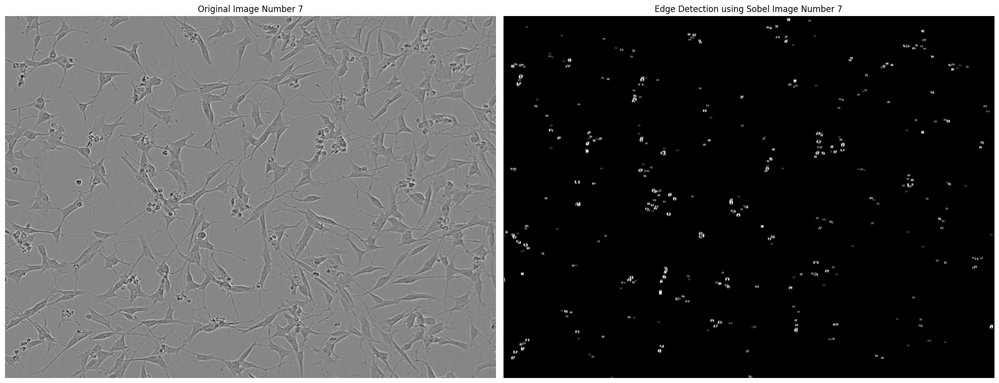
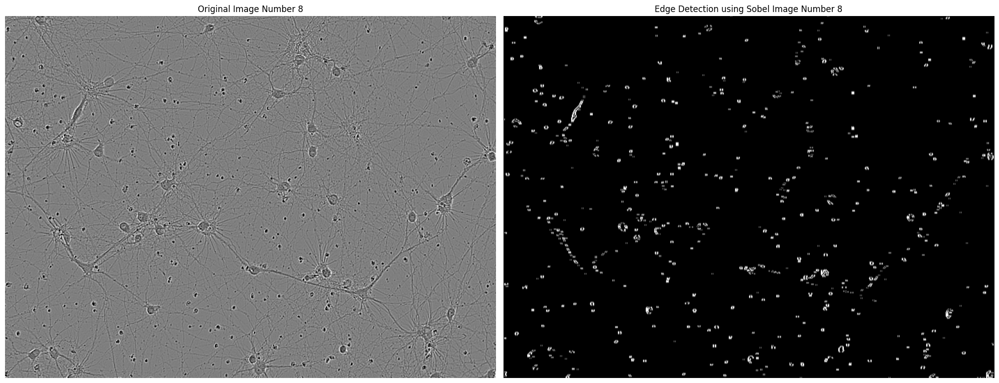
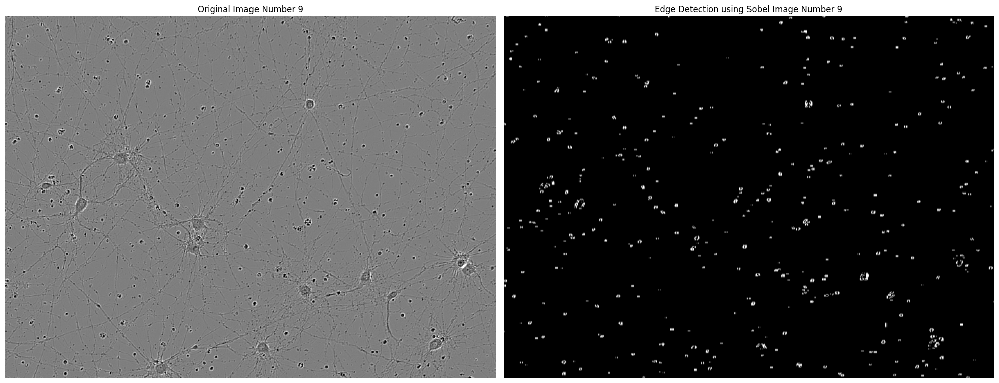
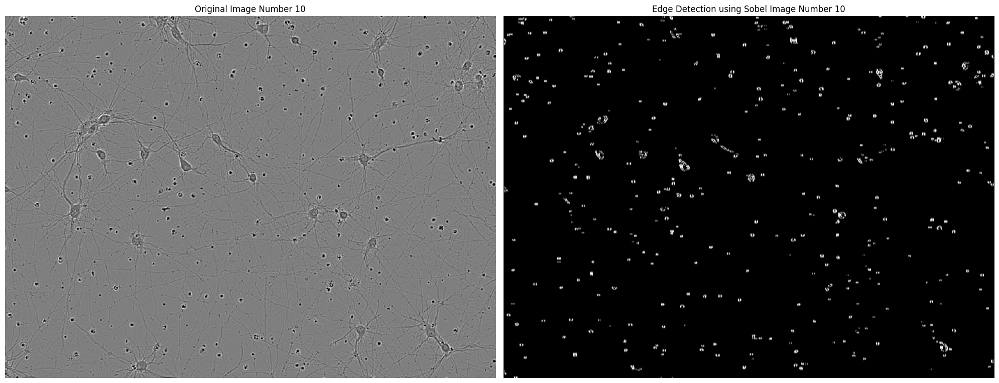

I have used the Sobel Operator and the mathematical expressions are as follows:

Sobel X Kernel (Detects Horizontal Edges):

$ G_x = \begin{bmatrix} -1 & 0 & +1 \\ -2 & 0 & +2 \\ -1 & 0 & +1 \end{bmatrix} $

Sobel Y Kernel (Detects Vertical Edges):

$ G_y = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ +1 & +2 & +1 \end{bmatrix} $

- **Gx**: The horizontal edge kernel emphasizes horizontal edges by detecting changes in brightness along the x-axis.
- **Gy**: The vertical edge kernel emphasizes vertical edges by detecting changes in brightness along the y-axis.

When the kernels are applied to an image, they produce two derivative estimates: one for horizontal changes (Gx) and one for vertical changes (Gy). These derivatives can be combined to find the overall gradient magnitude at each point in the image:

$ Gradient\;Magnitude = \sqrt{Gx^2 + Gy^2} $



### Part V: Segmentation

Apply a cell segmentation technique to isolate neuronal cells in the microscopy images from the Sartorius dataset. Follow these guidelines:

- **Select a Segmentation Technique**: Choose a segmentation technique that you find suitable for isolating cells in the image. You may draw inspiration from one of the example notebooks on Kaggle, use a classical computer vision technique, or utilize a Python package specifically designed for cell segmentation.
- **Apply the Technique**: Apply your chosen segmentation method to the same subset of 10 images. You have the flexibility to use either the original images or the augmented versions (post blurring, thresholding, etc.) from your previous tasks.
- **Visualize the Results**: Create visualizations that clearly show the segmentation results. Display the segmented cells in a way that differentiates them from the rest of the image.

Additionally, include a markdown cell where you:

- **Explain Your Procedure**: Outline the steps you followed in your segmentation process.
- **Justify Your Choice of Technique**: Provide a rationale for selecting the particular segmentation technique.

In [ ]:

from skimage.measure import regionprops
import matplotlib.patches as mpatches
from skimage.morphology import label
from skimage import measure


for i, GM_image in enumerate(GM_list):
    ImageSeg = images_list[i].copy()
    overlay_image = cv2.cvtColor(ImageSeg, cv2.COLOR_GRAY2RGB)

    filtered_contours =[]
    _, binary_image = cv2.threshold(GM_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    num_labels, labels = cv2.connectedComponents(binary_image)
    label_image =label(labels, connectivity=2)


    contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    min_area_threshold = 10  

    for contour in contours:
        area = cv2.contourArea(contour)
        if area > min_area_threshold:
            filtered_contours.append(contour)


# Draw contours on a blank canvas
    contour_image = np.zeros_like(GM_image, dtype=np.uint8)
    cv2.drawContours(contour_image, filtered_contours, -1, color =(233,0,0), thickness=4) 
    overlay_image[contour_image > 0] = [233, 0, 5]


    fig, axs = plt.subplots(1,2,figsize =(8,4))
    axs[0].imshow(contour_image, cmap = "jet")
    axs[0].set_title(f'Segmented Regions in Image number {i+1}')
    axs[0].axis('off')
    
    axs[1].imshow(overlay_image, cmap= "jet")
    axs[1].set_title(f'Segmented Cells in Original Image {i+1}')
    axs[1].axis('off')
    plt.tight_layout()
    plt.show()
  




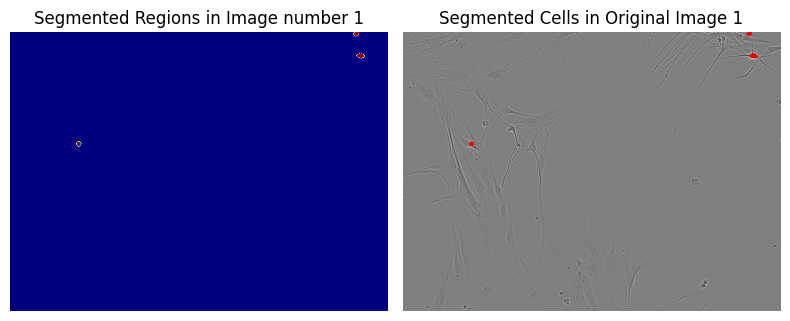
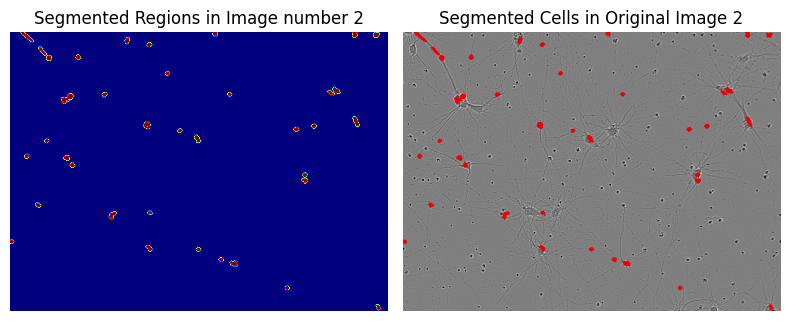
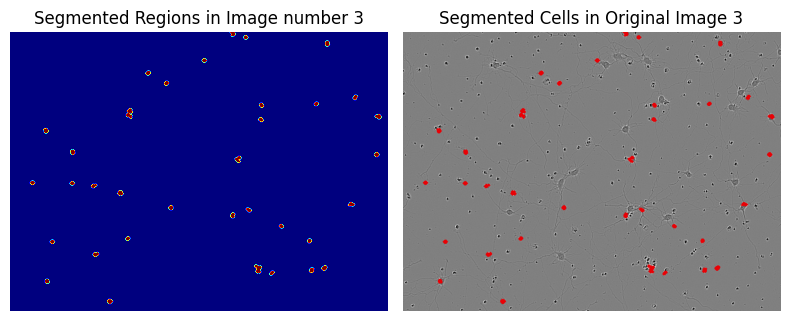
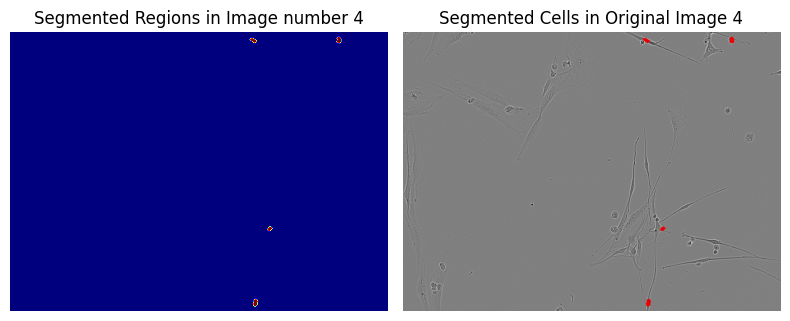
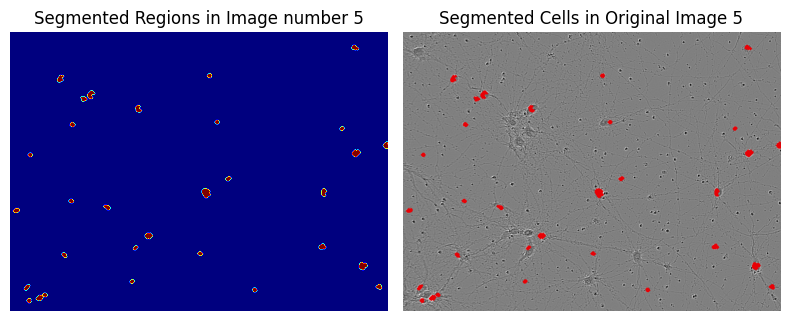
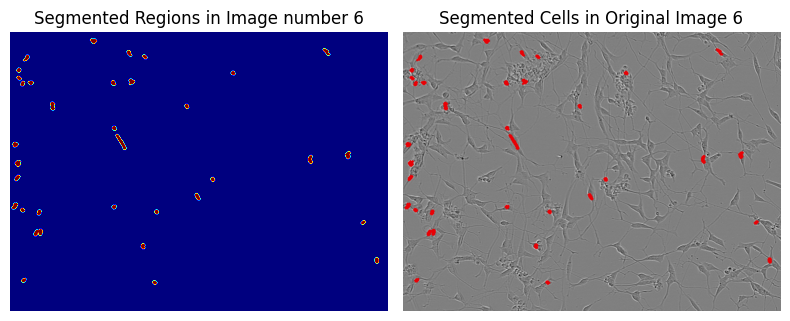
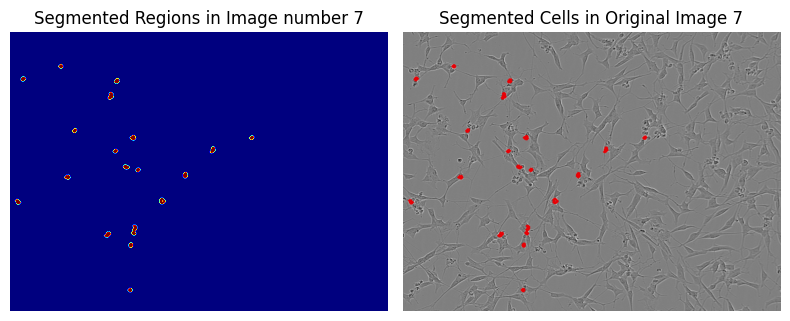
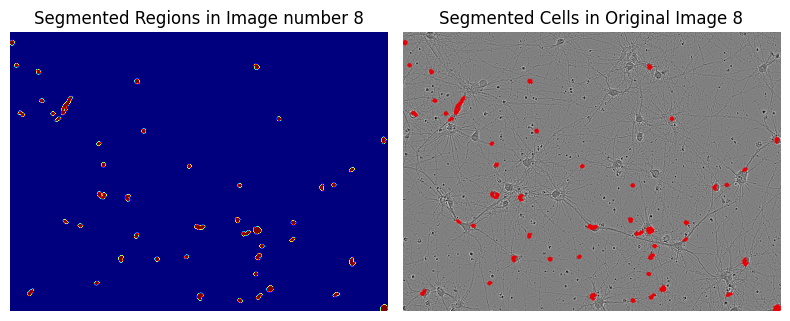
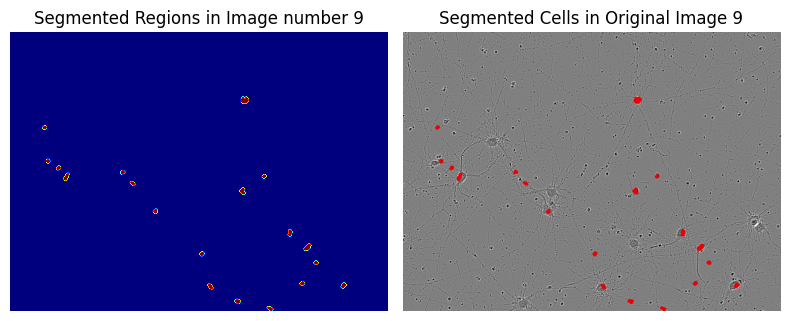
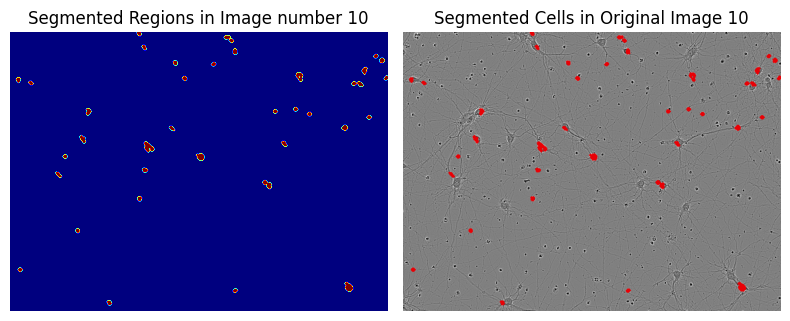

In those images, the the primary challenge was to differentiate between the bolb like features- which are the cells and the cells extensions- which I am assuming are axons and dendrites. 
Therefore, I have used simple Thresholding(in order to consider the cells extensions as background rather than foreground) and from the Gradient Magnitude image- and tried to segment the cells using the functions:

1. cv2.connectedComponents() to identify connected regions in the image.
2. label()- assigned unique labels to each connected component.
3. cv2.findContours() to detect contours in the image and set a minimum area threshold to filter out small contours.
4. Drawing Contours- using cv2.drawContours() for visualization.

The segmentation process yielded unsatisfactory results, prompting an analysis of the underlying factors contributing to its inefficacy. It is apparent that the segmentation technique employed faced limitations primarily attributed to the inherent diversity in images characteristics.
Each image possesses unique attributes, including variations in object morphology. These inherent differences present challenges for segmentation, as a one-size-fits-all approach often proves inadequate.